In [3]:
library(Seurat)
library(dplyr)
library(ggplot2)
library(patchwork)
library(tibble)
library(qs)
library(ggplot2)
library(ggridges)
library(tidyr)
library(RColorBrewer)
library(readxl)
library(stringr)
library(ggpubr) 
library(viridis)

seed <- 123
set.seed(seed)
options(dplyr.summarise.inform = FALSE)

setwd("/home/a.garg/integration_project/step_14/11march_final/")

In [ ]:
#sobj_new <- qread("/home/a.garg/integration_project/step_10/ROSMAP_edited_cell_type/Allfour_SCT_integration_layer_wdedited_cells.qs", nthreads = 6)
#sobj_new[["RNA"]] <- JoinLayers(sobj_new[["RNA"]])
#sobj_new <- SCTransform(sobj_new, assay = "RNA", verbose = TRUE) # runtime approx 2h
#qsave(sobj_new, "/home/a.garg/integration_project/step_14/Allfour_SCT_integration_layer_wdedited_cells_newanno_SCT.qs", nthreads = 6)

In [2]:
sobj_new <- qread("/home/a.garg/integration_project/step_14/Allfour_SCT_integration_layer_wdedited_cells_newanno_SCT.qs", nthreads = 6)
sobj_new[["RNA"]] <- JoinLayers(sobj_new[["RNA"]])
sobj_new <- SCTransform(sobj_new, assay = "RNA", verbose = TRUE) # runtime approx 2h
qsave(sobj_new, "/home/a.garg/integration_project/step_14/Allfour_SCT_integration_layer_wdedited_cells_newanno_SCT.qs", nthreads = 6)

In [3]:
table(sobj_new$cca_cluster)


    0     1    11    12    13     2     3     4     5     6     7     8 
46705 35571  4201  1723  1479 26385 18843 19277 15017 14814 12018 11542 

In [3]:
sobj_new_sub <- subset(sobj_new, subset = batch == "BJ")

In [4]:
sobj_new_sub <- subset(sobj_new_sub, subset = Integrated_cell_type == "Homeostatic" | Integrated_cell_type =="Activated")

In [5]:
qual_col_pals <- brewer.pal.info[brewer.pal.info$category == "qual", ]
col_vector <- unlist(mapply(brewer.pal, qual_col_pals$maxcolors, rownames(qual_col_pals)))

In [6]:
p1 <- DimPlot(sobj_new, raster = "FALSE", reduction = "umap.cca", group.by = "Integrated_cell_type", alpha = 0.5, label = TRUE, pt.size = 0.5, label.size = 3, repel = TRUE, cols = col_vector[c(1:11, 14)], label.box = TRUE)

p2 <- DimPlot(sobj_new_sub, raster = "FALSE", reduction = "umap.cca", group.by = "Integrated_cell_type", alpha = 0.5, label = TRUE, pt.size = 0.5, label.size = 3, repel = TRUE, cols = col_vector[c(1:11, 14)], label.box = TRUE)


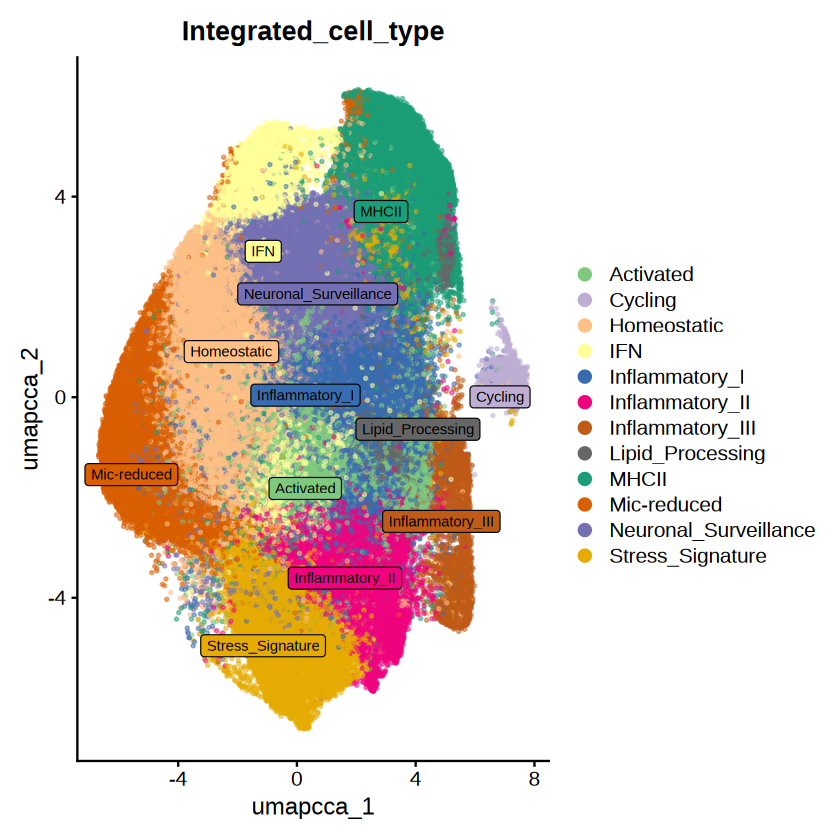

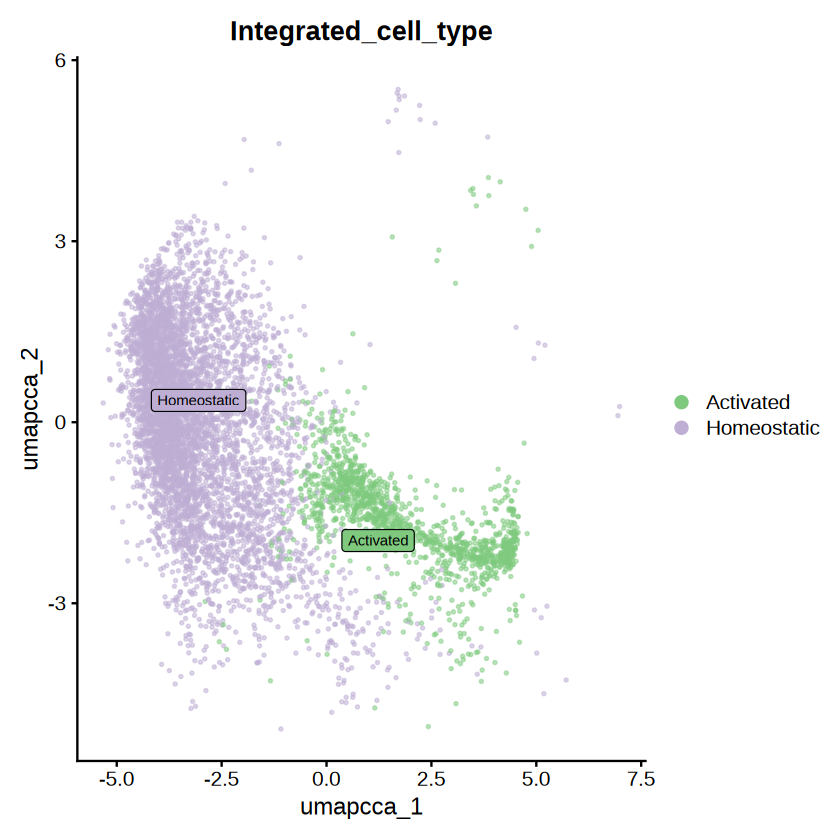

In [7]:
p1
p2

In [8]:
AD_before_annot <- readRDS(file = "/home/a.garg/integration_project/step_14/ADwithout_white_before_annot.rds")

In [9]:
   anchors <- FindTransferAnchors(reference = sobj_new_sub, query = AD_before_annot, normalization.method = "SCT", k.anchor = 10)
   predictions.assay <- TransferData(anchorset = anchors, refdata = sobj_new_sub$Integrated_cell_type, prediction.assay = TRUE, weight.reduction = AD_before_annot[["pca"]], dims = 1:15)
   AD_before_annot[["predictions"]] <- predictions.assay

Normalizing query using reference SCT model

Warning message:
“No layers found matching search pattern provided”
Performing PCA on the provided reference using 2963 features as input.

Projecting cell embeddings

Finding neighborhoods

Finding anchors

	Found 232 anchors

Finding integration vectors

Finding integration vector weights

Predicting cell labels



In [10]:
dir <- "/home/a.garg/integration_project/step_14/"
qsave(AD_before_annot, paste0(dir, "AD_afteranno_wd_Hom_activ_BJ", ".qs"))

In [2]:
file <- qread("/home/a.garg/integration_project/step_14/AD_afteranno_wd_Hom_activ_BJ.qs")

In [4]:
Idents(file) <- "layer_annotation"
file <- subset(file, idents = "Layer 1", invert = TRUE)

file$barcode <- colnames(file)
score_data <- as.data.frame(t(file@assays$predictions$data))
score_data$barcode <- rownames(score_data)

if (all(rownames(score_data) == colnames(file))) {
    data1 <- merge(x = file@meta.data, y = score_data)
}


Warning message:
“Not validating Seurat objects”
Warning message:
“Not validating Seurat objects”
Warning message:
“Not validating Seurat objects”


with layer 2-6 labels

Saving 6.67 x 6.67 in image
Saving 6.67 x 6.67 in image


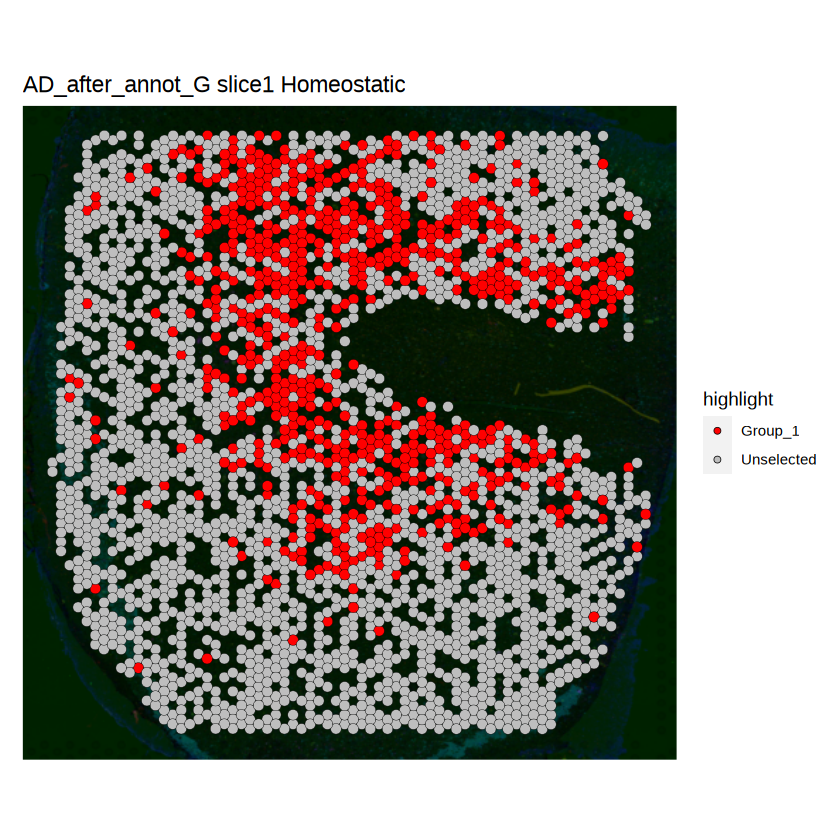

Saving 6.67 x 6.67 in image


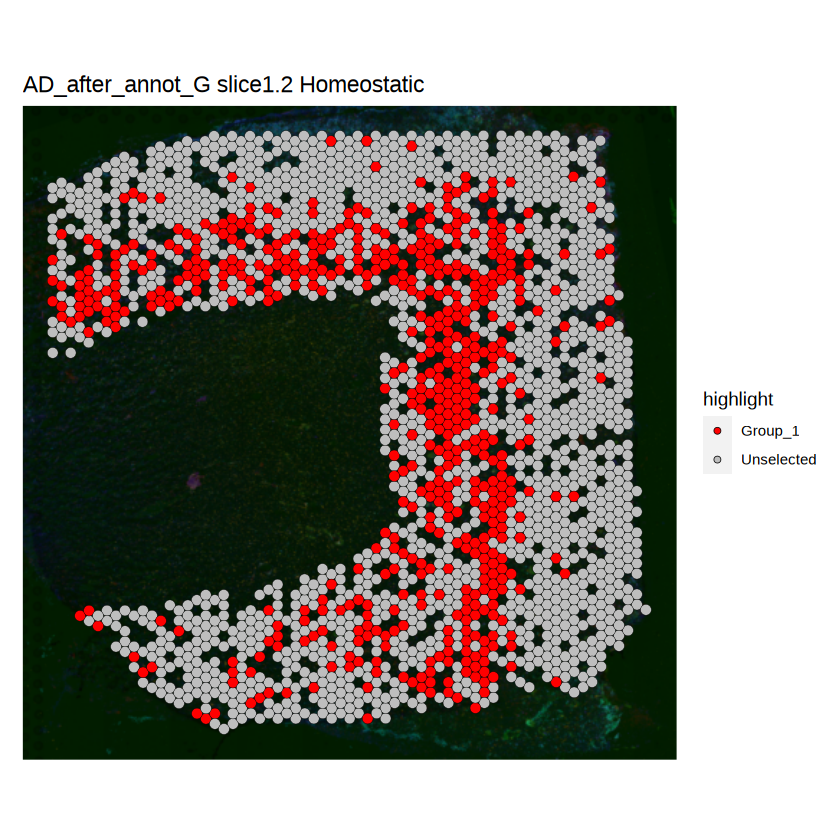

Saving 6.67 x 6.67 in image


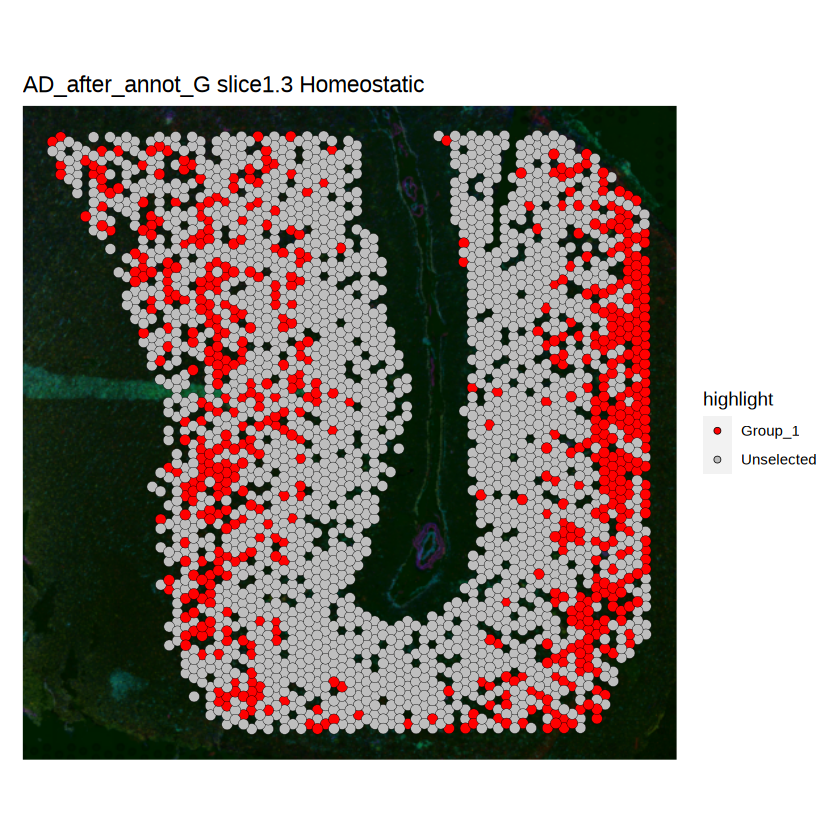

Saving 6.67 x 6.67 in image


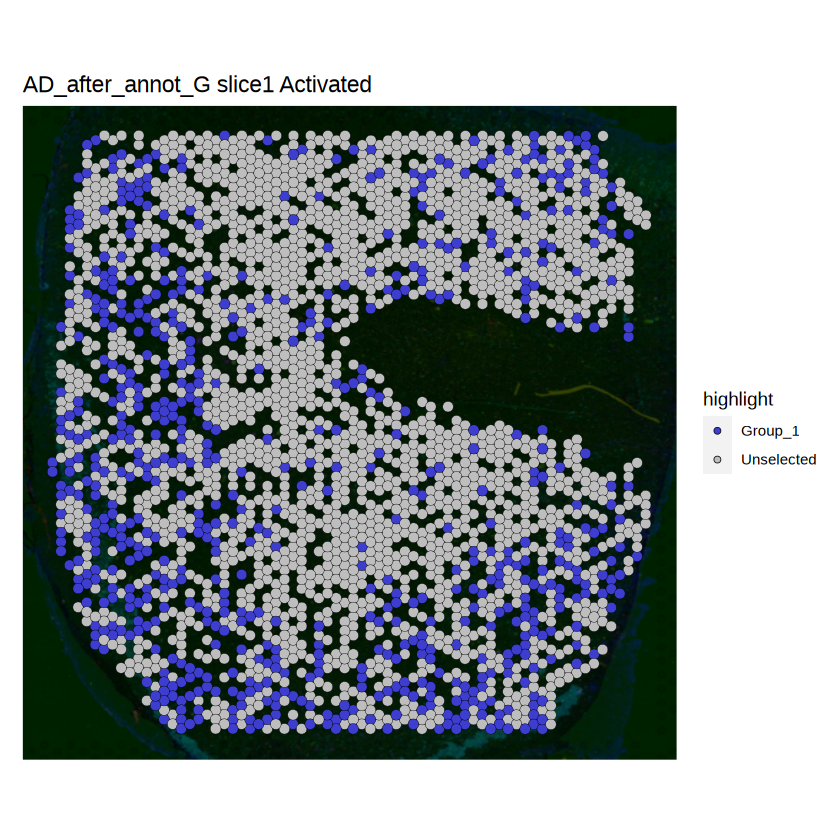

Saving 6.67 x 6.67 in image


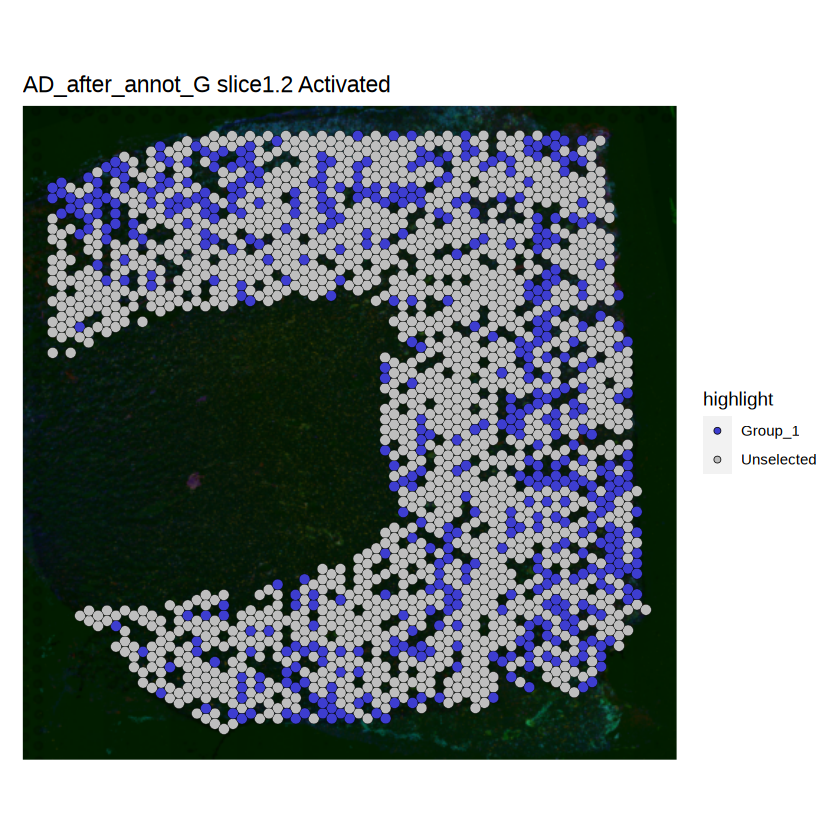

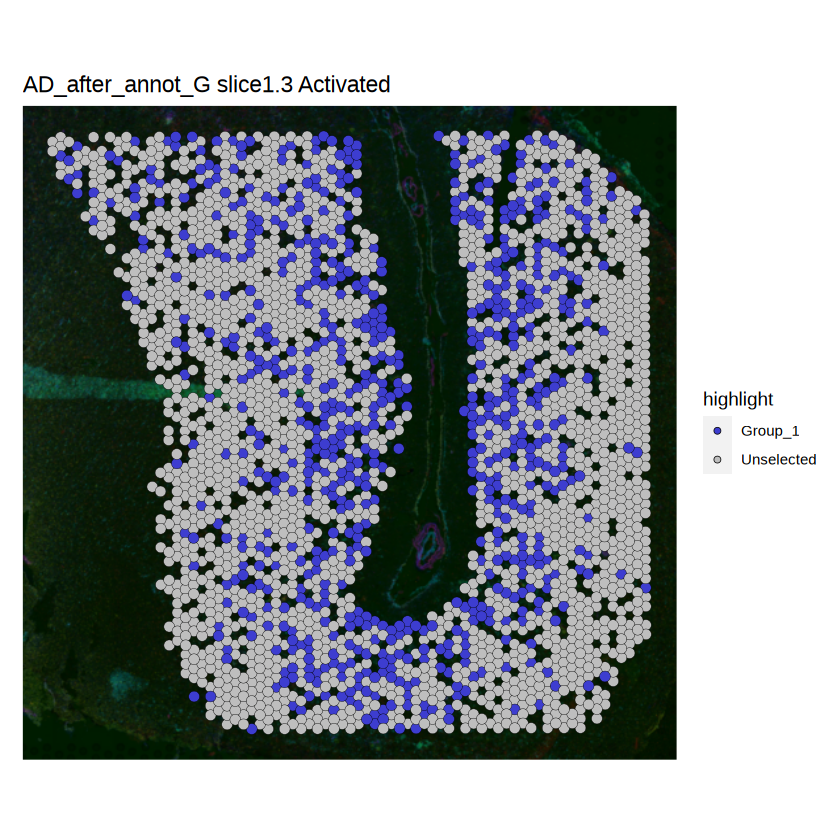

In [5]:
cell_state_list <- c('Homeostatic')

plot1 <- lapply(1:length(cell_state_list), function(ind) {
    nm <- c(cell_state_list)[ind]
    df <- data.frame(Cluster = factor(data1$AB, levels = c("Level 0", "Level 1", "Level 2", "Level 3", "Other")), Sig = data1[, nm], Sample = data1$sample_ID, barcode = data1$barcode, layer = data1$layer_annotation)
    df$Cluster <- droplevels(df$Cluster)

    # Using top 25 % predicted spot not the top 25 spots
    df_75th_percentile <- df %>%
        summarize(Quantile75 = quantile(Sig, 0.75))
    df_filtered1 <- df %>% dplyr::filter(Sig > df_75th_percentile[[1]])
     cell <- df_filtered1$barcode

    for (image in names(file@images)) {
       # print(image)
        p <- SpatialPlot(file, cells.highlight = list(cell), cols.highlight = c("#FF0000", "grey"), label.size = 3, images = image)
        p <- p + ggtitle(paste("AD_after_annot_G", image, nm, sep = " "))
        plot(p)

         p1 <- p + ggtitle("")+NoLegend()
        dir = "/home/a.garg/integration_project/step_14/11march_final/Plots"
        ggsave(paste("BJ_", nm, "_", image, "_layer2-6_.pdf", sep = ""), p1, path = dir)
    }
})

cell_state_list <- c('Activated')

plot2 <- lapply(1:length(cell_state_list), function(ind) {
    nm <- c(cell_state_list)[ind]
    df <- data.frame(Cluster = factor(data1$AB, levels = c("Level 0", "Level 1", "Level 2", "Level 3", "Other")), Sig = data1[, nm], Sample = data1$sample_ID, barcode = data1$barcode, layer = data1$layer_annotation)
    df$Cluster <- droplevels(df$Cluster)

    # Using top 25 % predicted spot not the top 25 spots
    df_75th_percentile <- df %>%
        summarize(Quantile75 = quantile(Sig, 0.75))
    df_filtered1 <- df %>% dplyr::filter(Sig > df_75th_percentile[[1]])
    
     cell <- df_filtered1$barcode

    for (image in names(file@images)) {
       # print(image)
        p <- SpatialPlot(file, cells.highlight = list(cell), cols.highlight = c("#3D3DD0", "grey"), label.size = 3, images = image)
        p <- p + ggtitle(paste("AD_after_annot_G", image, nm, sep = " "))
        plot(p)

         p1 <- p + ggtitle("")+NoLegend()
        dir = "/home/a.garg/integration_project/step_14/11march_final/Plots"
        ggsave(paste("BJ_", nm, "_", image, "_layer2-6_.pdf", sep = ""), p1, path = dir)
    }
})

In all layers

Warning message:
“Not validating Seurat objects”
Warning message:
“Not validating Seurat objects”
Warning message:
“Not validating Seurat objects”
Saving 6.67 x 6.67 in image
Saving 6.67 x 6.67 in image


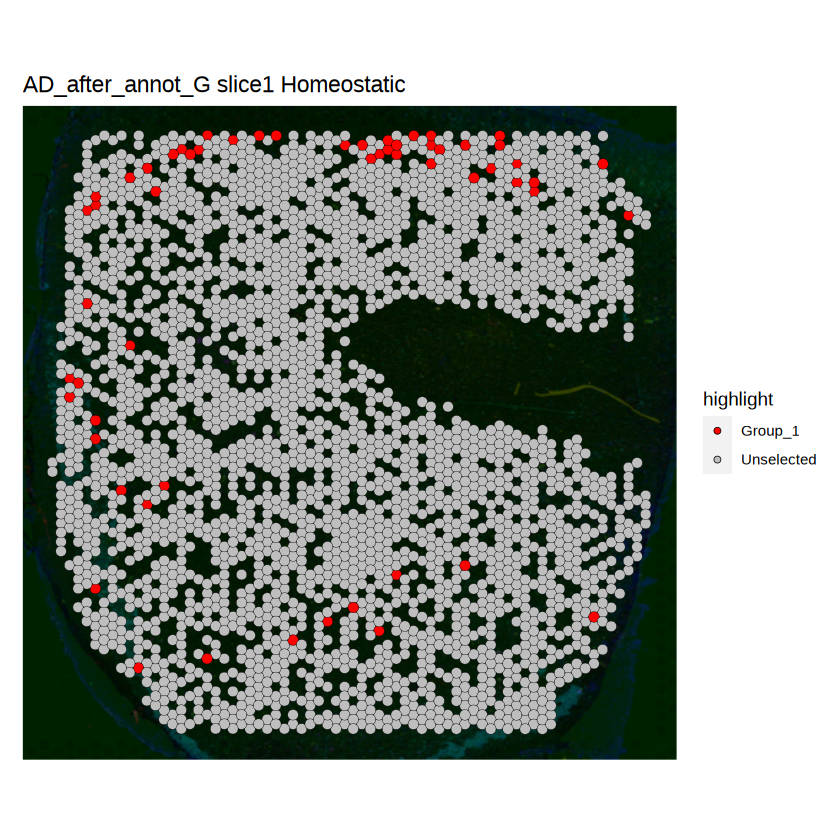

Saving 6.67 x 6.67 in image


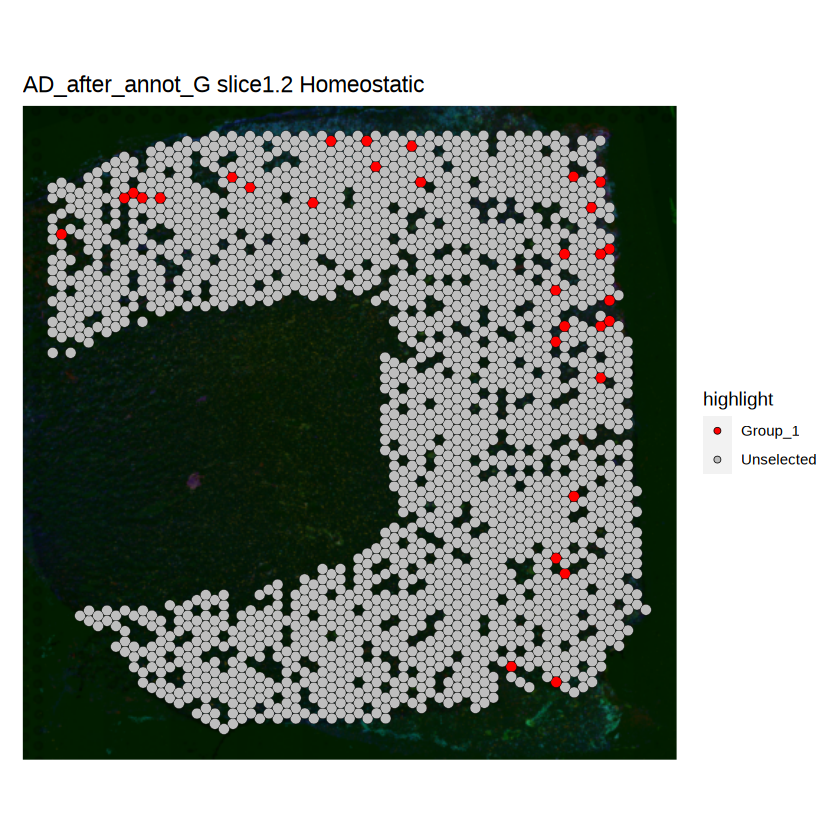

Saving 6.67 x 6.67 in image


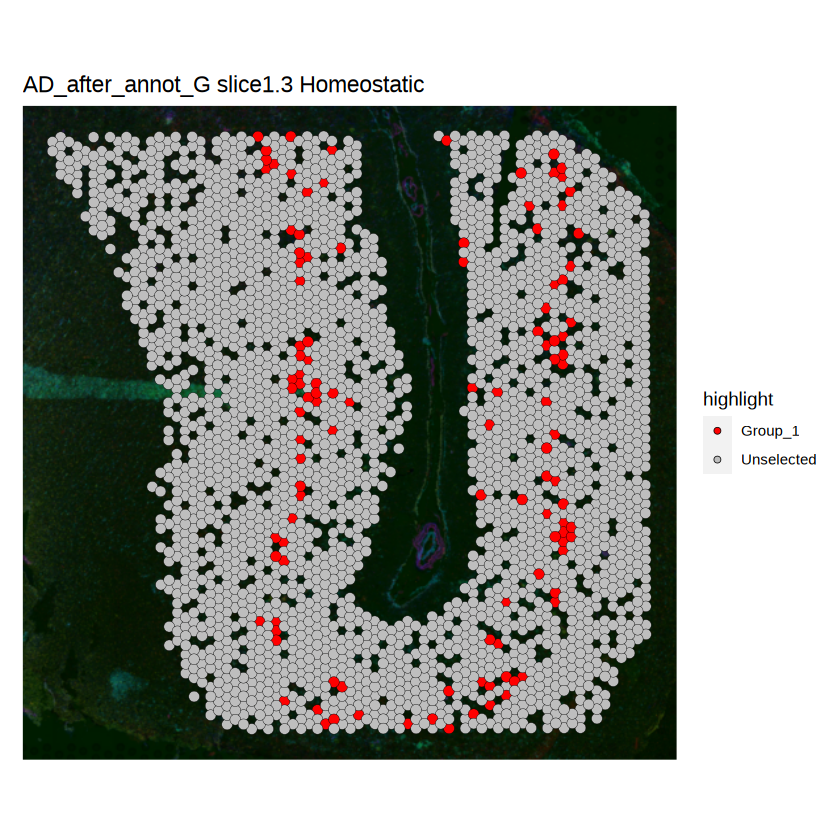

Saving 6.67 x 6.67 in image


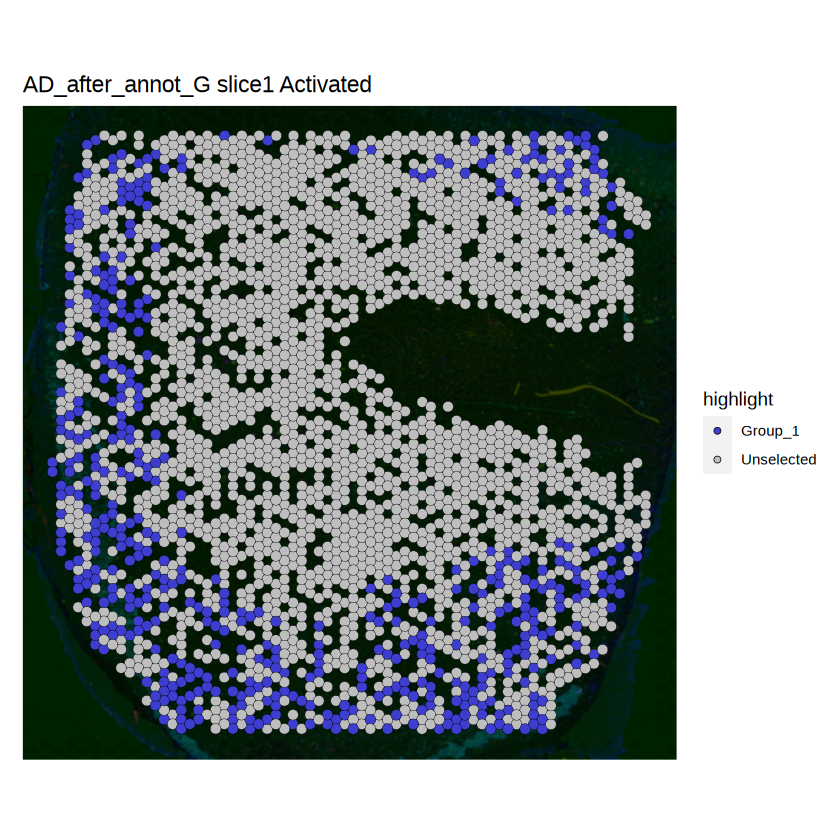

Saving 6.67 x 6.67 in image


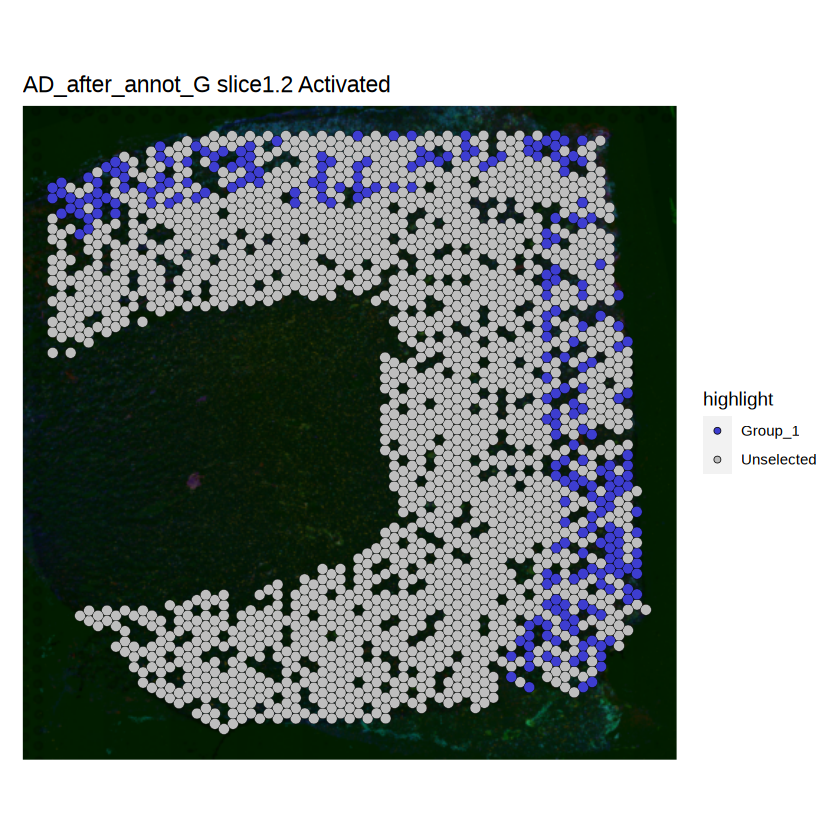

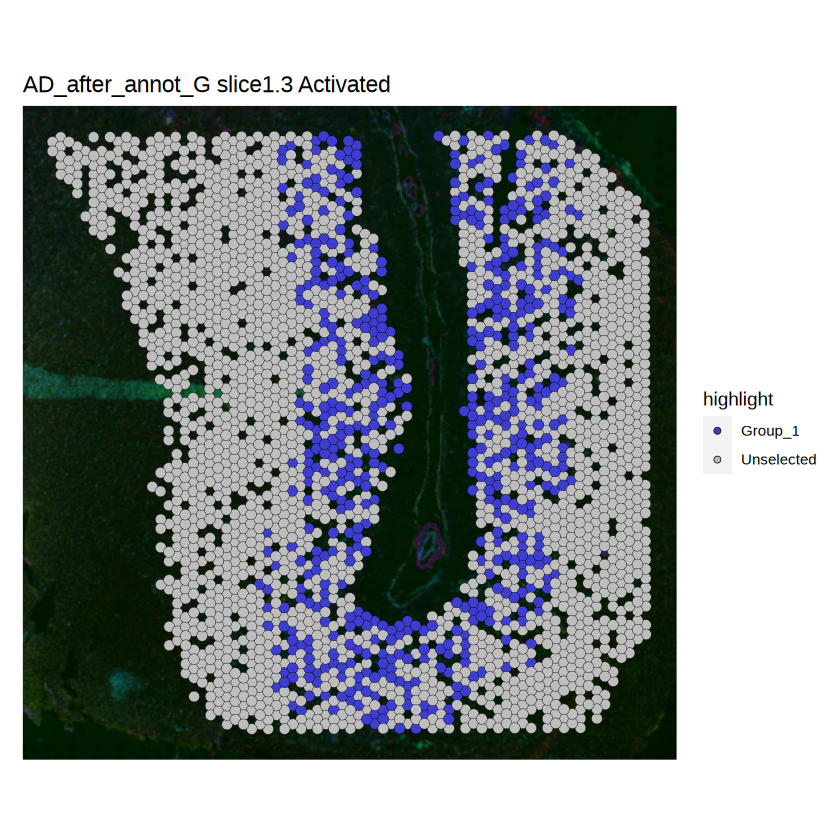

In [6]:
cell_state_list <- c('Homeostatic')

plot1 <- lapply(1:length(cell_state_list), function(ind) {
    nm <- c(cell_state_list)[ind]
    df <- data.frame(Cluster = factor(data1$AB, levels = c("Level 0", "Level 1", "Level 2", "Level 3", "Other")), Sig = data1[, nm], Sample = data1$sample_ID, barcode = data1$barcode, layer = data1$layer_annotation)
    df$Cluster <- droplevels(df$Cluster)

    # Using top 25 % predicted spot not the top 25 spots
    df_75th_percentile <- df %>%
        summarize(Quantile75 = quantile(Sig, 0.75))
    df_filtered1 <- df %>% dplyr::filter(Sig > df_75th_percentile[[1]])

    file_ly2_3 <- subset(df_filtered1, subset = layer %in% c("Layer 2", "Layer 3"))

    cell <- file_ly2_3$barcode
    # cell <- df_filtered1$barcode

    for (image in names(file@images)) {
       # print(image)
        p <- SpatialPlot(file, cells.highlight = list(cell), cols.highlight = c("#FF0000", "grey"), label.size = 3, images = image)
        p <- p + ggtitle(paste("AD_after_annot_G", image, nm, sep = " "))
        plot(p)

         p1 <- p + ggtitle("")+NoLegend()
        dir = "/home/a.garg/integration_project/step_14/11march_final/Plots"
        ggsave(paste("BJ_", nm, "_", image, ".pdf", sep = ""), p1, path = dir)
    }
})

cell_state_list <- c('Activated')

plot2 <- lapply(1:length(cell_state_list), function(ind) {
    nm <- c(cell_state_list)[ind]
    df <- data.frame(Cluster = factor(data1$AB, levels = c("Level 0", "Level 1", "Level 2", "Level 3", "Other")), Sig = data1[, nm], Sample = data1$sample_ID, barcode = data1$barcode, layer = data1$layer_annotation)
    df$Cluster <- droplevels(df$Cluster)

    # Using top 25 % predicted spot not the top 25 spots
    df_75th_percentile <- df %>%
        summarize(Quantile75 = quantile(Sig, 0.75))
    df_filtered1 <- df %>% dplyr::filter(Sig > df_75th_percentile[[1]])

    file_ly2_3 <- subset(df_filtered1, subset = layer %in% c("Layer 2", "Layer 3"))

    cell <- file_ly2_3$barcode
   #  cell <- df_filtered1$barcode

    for (image in names(file@images)) {
       # print(image)
        p <- SpatialPlot(file, cells.highlight = list(cell), cols.highlight = c("#3D3DD0", "grey"), label.size = 3, images = image)
        p <- p + ggtitle(paste("AD_after_annot_G", image, nm, sep = " "))
        plot(p)

         p1 <- p + ggtitle("")+NoLegend()
        dir = "/home/a.garg/integration_project/step_14/11march_final/Plots"
        ggsave(paste("BJ_", nm, "_", image, ".pdf", sep = ""), p1, path = dir)
    }
})

In [2]:
file <- qread("/home/a.garg/integration_project/step_14/AD_afteranno_wd_Hom_activ_BJ.qs")
Idents(file) <- "layer_annotation"
file <- subset(file, idents = "Layer 1", invert = TRUE)
cell_state_list<- c('Homeostatic','Activated')

Warning message:
“Not validating Seurat objects”
Warning message:
“Not validating Seurat objects”
Warning message:
“Not validating Seurat objects”


In [6]:
table(file$sample_ID)


AD-1 AD-2 AD-3 
2695 2048 2808 

In [5]:
# AD sample counts in ach layers
lapply(c("AD-1","AD-2","AD-3"), function(i) {
print(i)
df <- subset(file, subset = sample_ID == i)
table(df$layer_annotation)
})

[1] "AD-1"


Warning message:
“Not validating Seurat objects”
Warning message:
“Not validating Seurat objects”
Warning message:
“Not validating Seurat objects”


[1] "AD-2"


Warning message:
“Not validating Seurat objects”
Warning message:
“Not validating Seurat objects”
Warning message:
“Not validating Seurat objects”


[1] "AD-3"


Warning message:
“Not validating Seurat objects”
Warning message:
“Not validating Seurat objects”
Warning message:
“Not validating Seurat objects”


[[1]]

Layer 2 Layer 3 Layer 4 Layer 5 Layer 6 
    189    1082     450     468     506 

[[2]]

Layer 2 Layer 3 Layer 4 Layer 5 Layer 6 
    147     538     228     724     411 

[[3]]

Layer 2 Layer 3 Layer 4 Layer 5 Layer 6 
    443     991     380     676     318 


In [14]:
    file$barcode <- colnames(file)
    score_data <- as.data.frame(t(file@assays$predictions$data))
    score_data$barcode <- rownames(score_data)

    if (all(rownames(score_data) == colnames(file))) {
        data1 <- merge(x = file@meta.data, y = score_data)
    }
    lapply(1:length(cell_state_list), function(ind) {
    # ind =1
        nm <- c(cell_state_list)[ind]
    df <- data.frame(Cluster = factor(data1$layer_annotation, levels = c("Layer 1", "Layer 2", "Layer 3", "Layer 4", "Layer 5", "Layer 6")), Sig = data1[, nm], Sample = data1$sample_ID, brcode= data1$barcode)
        df$Cluster <- droplevels(df$Cluster)
        
#Using top 25 % predicted spot not the top 25 spots
   df_75th_percentile <- df %>% 
     summarize(Quantile75 = quantile(Sig, 0.75))
#count top 25 % predicted spot not the top 25 spots
    df_filtered1 <- df %>% dplyr::filter(Sig > df_75th_percentile[[1]])
    table(df_filtered1$Cluster) # in all sample
    })
 table(file$layer_annotation)

[[1]]

Layer 2 Layer 3 Layer 4 Layer 5 Layer 6 
     24     180     278     900     506 

[[2]]

Layer 2 Layer 3 Layer 4 Layer 5 Layer 6 
    299     961     209     260     159 



Layer 2 Layer 3 Layer 4 Layer 5 Layer 6 
    779    2611    1058    1868    1235 

In [17]:
s1 <- "AB"
s2 <- "AT8"
s <- s2

In [18]:
   file$barcode <- colnames(file)
    score_data <- as.data.frame(t(file@assays$predictions$data))
    score_data$barcode <- rownames(score_data)

    if (all(rownames(score_data) == colnames(file))) {
        data1 <- merge(x = file@meta.data, y = score_data)
    }
    lapply(1:length(cell_state_list), function(ind) {
        nm <- c(cell_state_list)[ind]
      df <- data.frame(Cluster = factor(data1$layer_annotation, levels = c("Layer 1", "Layer 2", "Layer 3", "Layer 4", "Layer 5", "Layer 6")), Sig = data1[, nm], Sample = data1$sample_ID, Level = data1[,s]) # ATB= data1$AT8
        df$Cluster <- droplevels(df$Cluster)
#Using top 25 % predicted spot not the top 25 spots
   df_75th_percentile <- df %>% 
     summarize(Quantile75 = quantile(Sig, 0.75))
#count top 25 % predicted spot not the top 25 spots
    df_filtered1 <- df %>% dplyr::filter(Sig > df_75th_percentile[[1]])
      print(s)
     table(df_filtered1[,"Level"])
    })
 table(file@meta.data[,s])

[1] "AT8"
[1] "AT8"


[[1]]

Level 0 Level 1 Level 2 Level 3   Other 
    492     722     385     203      86 

[[2]]

Level 0 Level 1 Level 2 Level 3   Other 
    484     714     352     179     159 



Level 0 Level 1 Level 2 Level 3   Other 
   2016    2866    1388     739     542 

In [24]:
s1 <- "AB"
s2 <- "AT8"
s <- s2

In [27]:
layer1 <- c("Layer 2","Layer 3")
layer2 <- c("Layer 4", "Layer 5", "Layer 6")
layer <- layer2

In [28]:
    file$barcode <- colnames(file)
    score_data <- as.data.frame(t(file@assays$predictions$data))
    score_data$barcode <- rownames(score_data)

    if (all(rownames(score_data) == colnames(file))) {
        data1 <- merge(x = file@meta.data, y = score_data)
    }
    lapply(1:length(cell_state_list), function(ind) {
       nm <- c(cell_state_list)[ind]
       df <- data.frame(Cluster = factor(data1$layer_annotation, levels = c("Layer 1", "Layer 2", "Layer 3", "Layer 4", "Layer 5", "Layer 6")), Sig = data1[, nm], Sample = data1$sample_ID, Level = data1[,s]) # ATB= data1$AT8
        df$Cluster <- droplevels(df$Cluster)
        
# #Using top 25 % predicted spot not the top 25 spots
   df_75th_percentile <- df %>%
    summarize(Quantile75 = quantile(Sig, 0.75))
#count top 25 % predicted spot not the top 25 spots
   df_filtered1 <- df %>% dplyr::filter(Sig > df_75th_percentile[[1]])


 file_ly <- subset(df_filtered1, subset = Cluster %in% layer)
 table(file_ly[,"Level"])

    })

########## TOTAL ######################### 

file_ly <- subset(file, subset = layer_annotation %in% layer)
 table(file_ly@meta.data[,s])

[[1]]

Level 0 Level 1 Level 2 Level 3   Other 
    443     646     336     184      75 

[[2]]

Level 0 Level 1 Level 2 Level 3   Other 
    174     221     127      61      45 


Warning message:
“Not validating Seurat objects”
Warning message:
“Not validating Seurat objects”
Warning message:
“Not validating Seurat objects”



Level 0 Level 1 Level 2 Level 3   Other 
   1117    1546     797     439     262 

In [31]:
s1 <- "AB"
s2 <- "AT8"
s <- s2

In [32]:
 file$barcode <- colnames(file)
    score_data <- as.data.frame(t(file@assays$predictions$data))
    score_data$barcode <- rownames(score_data)

    if (all(rownames(score_data) == colnames(file))) {
        data1 <- merge(x = file@meta.data, y = score_data)
    }

  
    lapply(1:length(cell_state_list), function(ind) {
       nm <- c(cell_state_list)[ind]
       df <- data.frame(Cluster = factor(data1$layer_annotation, levels = c("Layer 1", "Layer 2", "Layer 3", "Layer 4", "Layer 5", "Layer 6")), Sig = data1[, nm], Sample = data1$sample_ID, Level = data1[,s]) 
        df$Cluster <- droplevels(df$Cluster)
        
# #Using top 25 % predicted spot not the top 25 spots
   df_75th_percentile <- df %>%
    summarize(Quantile75 = quantile(Sig, 0.75))
#count top 25 % predicted spot not the top 25 spots
   df_filtered1 <- df %>% dplyr::filter(Sig > df_75th_percentile[[1]])
 file_ly2_3 <- subset(df_filtered1, subset = Cluster %in% c("Layer 2","Layer 3"))

# in each sample
layer_val <- lapply(c("AD-1","AD-2","AD-3"), function(i) {
print(i)
df_check <- subset(file_ly2_3, subset = Sample == i)
table(df_check[,"Level"])
})
})

#########################
file_ly2_3 <- subset(file, subset = layer_annotation %in% c("Layer 2","Layer 3"))
#table(file_ly@meta.data[,s])
 
layer_val <- lapply(c("AD-1","AD-2","AD-3"), function(i) {
print(i)
df_check <- subset(file_ly2_3, subset = sample_ID == i)
table(df_check@meta.data[,s])   
})
layer_val

[1] "AD-1"
[1] "AD-2"
[1] "AD-3"
[1] "AD-1"
[1] "AD-2"
[1] "AD-3"


[[1]]
[[1]][[1]]

Level 0 Level 1 Level 2 Level 3 
     12      29      13       4 

[[1]][[2]]

Level 0 Level 1 Level 2 Level 3 
     13       9       8       1 

[[1]][[3]]

Level 0 Level 1 Level 2 Level 3   Other 
     24      38      28      14      11 


[[2]]
[[2]][[1]]

Level 0 Level 1 Level 2 Level 3   Other 
    145     233      64      12      15 

[[2]][[2]]

Level 0 Level 1 Level 2 Level 3   Other 
    106     103      31      13       1 

[[2]][[3]]

Level 0 Level 1 Level 2 Level 3   Other 
     59     157     130      93      98 



Warning message:
“Not validating Seurat objects”
Warning message:
“Not validating Seurat objects”
Warning message:
“Not validating Seurat objects”


[1] "AD-1"


Warning message:
“Not validating Seurat objects”
Warning message:
“Not validating Seurat objects”
Warning message:
“Not validating Seurat objects”


[1] "AD-2"


Warning message:
“Not validating Seurat objects”
Warning message:
“Not validating Seurat objects”
Warning message:
“Not validating Seurat objects”


[1] "AD-3"


Warning message:
“Not validating Seurat objects”
Warning message:
“Not validating Seurat objects”
Warning message:
“Not validating Seurat objects”


[[1]]

Level 0 Level 1 Level 2 Level 3   Other 
    386     637     165      45      38 

[[2]]

Level 0 Level 1 Level 2 Level 3   Other 
    337     258      71      18       1 

[[3]]

Level 0 Level 1 Level 2 Level 3   Other 
    176     425     355     237     241 


Chisq-val

In [3]:
#homeostatic
data <- c(204,3186,1684,2477)
matrices <- matrix(data, nrow = 2, byrow = TRUE)
matrices
score <- chisq.test(matrices)
score

204,3186
1684,2477



	Pearson's Chi-squared test with Yates' continuity correction

data:  matrices
X-squared = 1180.7, df = 1, p-value < 2.2e-16


In [4]:
#activated
data <- c(1260,2130,628,3533)
matrices <- matrix(data, nrow = 2, byrow = TRUE)
matrices
score <- chisq.test(matrices)
score

1260,2130
628,3533



	Pearson's Chi-squared test with Yates' continuity correction

data:  matrices
X-squared = 484.31, df = 1, p-value < 2.2e-16


In [66]:
exl_file <- read_excel("/home/a.garg/integration_project/step_14/with_int_KD/check.xlsx", sheet = "Sheet12")
df1<- exl_file[1:2,1:6] 
df2<- exl_file[4,1:6] 
df3<- exl_file[6:7,1:6]
df4<- exl_file[9,1:6]

df1
df2
df3
df4

Cell_state,Level 0,Level 1,Level 2,Level 3,Other
<chr>,<chr>,<chr>,<chr>,<chr>,<chr>
Homeostatic,24,38,28,14,11
Activated,59,157,130,93,98


Cell_state,Level 0,Level 1,Level 2,Level 3,Other
<chr>,<chr>,<chr>,<chr>,<chr>,<chr>
Total number,176,425,355,237,241


Cell_state,Level 0,Level 1,Level 2,Level 3,Other
<chr>,<chr>,<chr>,<chr>,<chr>,<chr>
Homeostatic,91,53,25,11,NA
Activated,478,321,191,98,NA


Cell_state,Level 0,Level 1,Level 2,Level 3,Other
<chr>,<chr>,<chr>,<chr>,<chr>,<chr>
Total number,1258,833,478,241,NA


In [67]:
# pred1
df1 <- gather(df1, "Level", "pred_num1", -c(Cell_state))

df1 <- df1 %>%
  mutate(pred_num1 = as.numeric(pred_num1))

# pred2

df3 <- gather(df3, "Level", "pred_num2", -c(Cell_state))

df3 <- df3 %>%
  mutate(pred_num2 = as.numeric(pred_num2))

df3_merge <- merge(x=df1,y=df3, 
          by=c("Cell_state","Level"), all.x=TRUE, sort = FALSE)

# pred3
df2 <- gather(df2, "Level", "pred_num3", -c(Cell_state))
df2 <- df2 %>%
  mutate(pred_num3 = as.numeric(pred_num3))

# pred4
df4 <- gather(df4, "Level", "pred_num4", -c(Cell_state))
df4 <- df4 %>%
  mutate(pred_num4 = as.numeric(pred_num4))

df4_merge <- merge(x=df2,y=df4, 
          by=c("Level","Cell_state"), all.x=TRUE)

df_merged <- merge(x=df3_merge,y=df4_merge, 
          by=c("Level"), all.x=TRUE)

check<- df_merged %>% mutate(pred_num3 = pred_num3 - pred_num1) %>% mutate(pred_num4 = pred_num4 - pred_num2) %>% select(-Cell_state.y)

chisq_score <- lapply(seq(dim(check)[1]-2), function(x){
data <- check[,c(3:6)]
# Convert each row into a matrix
#x=1
matrices <- matrix(as.numeric(data[x, ]), nrow = 2, byrow = TRUE)
# Print the matrices
print(matrices)
score <- chisq.test(matrices)
return(sprintf('%s, %s, %s', check$Level[x], check$Cell_state.x[x], (format(score$p.value, digits=3,scientific=TRUE))))

}) 

as.data.frame(unlist(chisq_score))

     [,1] [,2]
[1,]   24   91
[2,]  152 1167
     [,1] [,2]
[1,]   59  478
[2,]  117  780
     [,1] [,2]
[1,]   38   53
[2,]  387  780
     [,1] [,2]
[1,]  157  321
[2,]  268  512
     [,1] [,2]
[1,]   28   25
[2,]  327  453
     [,1] [,2]
[1,]  130  191
[2,]  225  287
     [,1] [,2]
[1,]   14   11
[2,]  223  230
     [,1] [,2]
[1,]   93   98
[2,]  144  143


unlist(chisq_score)
<chr>
"Level 0, Homeostatic, 5.42e-03"
"Level 0, Activated, 2.87e-01"
"Level 1, Homeostatic, 1.2e-01"
"Level 1, Activated, 6.24e-01"
"Level 2, Homeostatic, 1.58e-01"
"Level 2, Activated, 3.64e-01"
"Level 3, Homeostatic, 6.5e-01"
"Level 3, Activated, 8.23e-01"


compartive barplot 

All

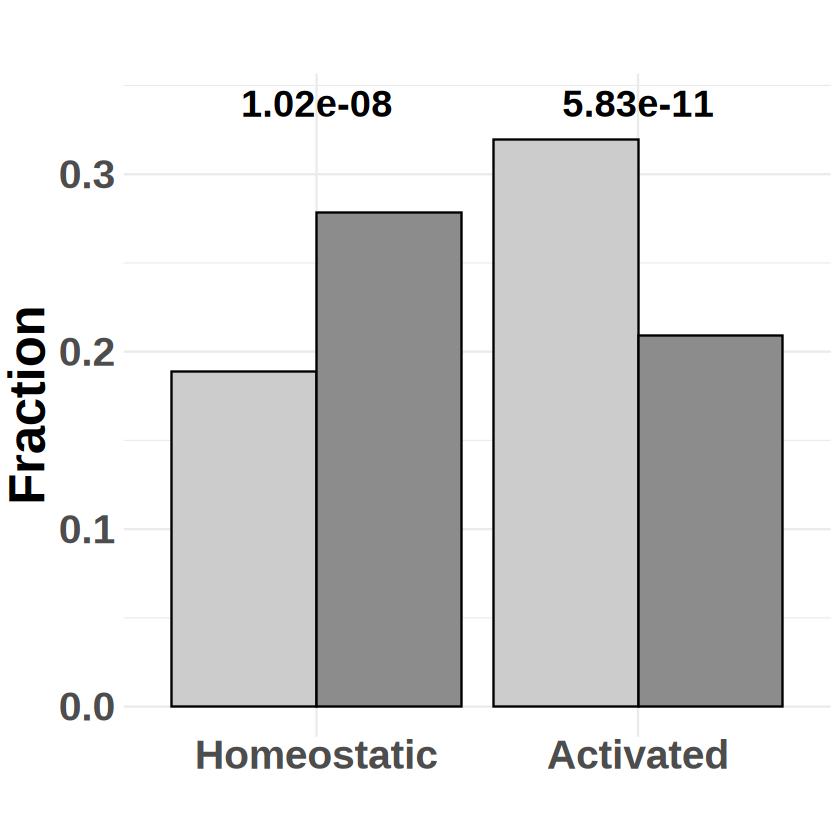

In [16]:
# read the data
exl_file <- read_excel("/home/a.garg/integration_project/step_14/11march_final/BJ_plot_data.xlsx", sheet = "Sheet1", .name_repair = "minimal")

data <- exl_file[, c(1:3, 6)]
data$Cell_state <- factor(data$Cell_state, levels = c("Homeostatic", "Activated"))
data$p.sci <- format(data$`Ab-pval`, digits = 3, scientific = TRUE)
data_long <- gather(data, key = "Ab_Type", value = "Ab_Value", `Ab-Level 0`, `Ab-Others`)



p <- ggplot(data_long, aes(x = Cell_state, y = Ab_Value, fill = Ab_Type)) +
    geom_bar(position = "dodge", stat = "identity", colour = "black") +
    ggtitle("") +
    theme_minimal() +
    scale_fill_manual(values = c("#cccccc", "#8c8c8c")) +
    annotate("text",
        x = c(1, 2), y = max(data_long$Ab_Value) + 0.02,
        label = data$p.sci, size = 8, fontface = "bold"
    ) +
    theme(
        text = element_text(size = 30, face = "bold"),
        axis.text.x = element_text(angle = 0, vjust = 1.5)
     ) + NoLegend()+xlab("")+ylab("Fraction")
ggsave("/home/a.garg/integration_project/step_14/11march_final/Plots/BJ_AB_all_layer.pdf", width = 6,height = 5, bg ="white")
p

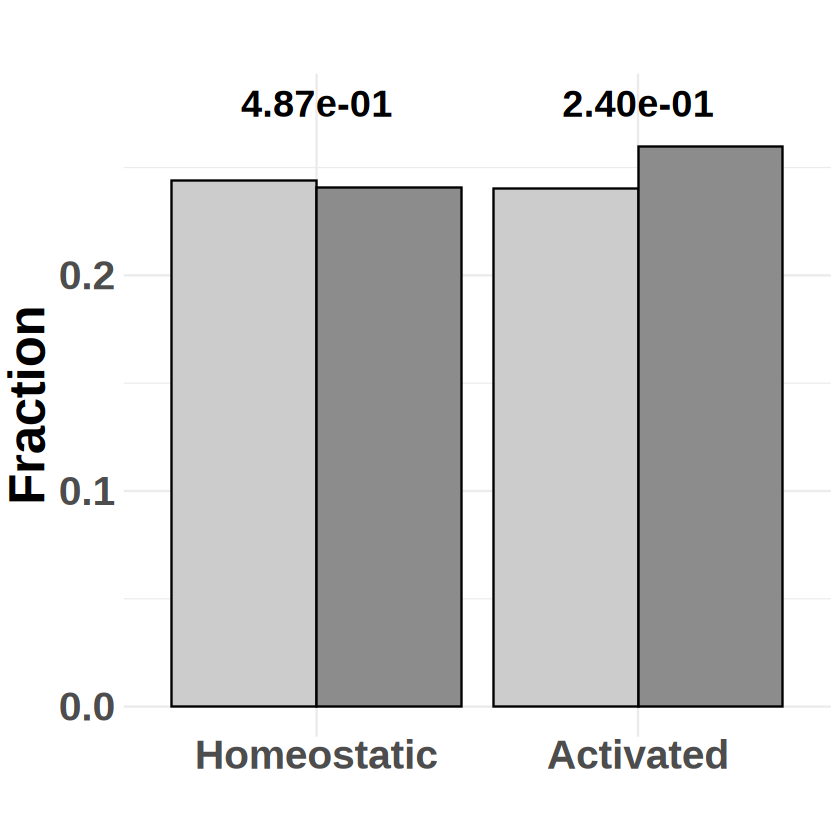

In [17]:
# read the data
exl_file <- read_excel("/home/a.garg/integration_project/step_14/11march_final/BJ_plot_data.xlsx", sheet = "Sheet1", .name_repair = "minimal")

data <- exl_file[, c(1, 4:5, 7)]
data$Cell_state <- factor(data$Cell_state, levels = c("Homeostatic", "Activated"))
data_long <- gather(data, key = "AT8_Type", value = "AT8_Value", `AT8-Level 0`, `AT8-Others`)
data$p.sci <- format(data$`AT8-pval`, scientific = TRUE)


p <- ggplot(data_long, aes(x = Cell_state, y = AT8_Value, fill = AT8_Type)) +
    geom_bar(position = "dodge", stat = "identity", colour = "black") +
    ggtitle("") +
    theme_minimal() +
    scale_fill_manual(values = c("#cccccc", "#8c8c8c")) +
    annotate("text",
        x = c(1, 2), y = max(data_long$AT8_Value) + 0.02,
        label = data$p.sci, size = 8, fontface = "bold"
    ) +
    theme(
        text = element_text(size = 30, face = "bold"),
        axis.text.x = element_text(angle = 0,  vjust = 1.5)
       ) + NoLegend()+xlab("")+ylab("Fraction")
ggsave("/home/a.garg/integration_project/step_14/11march_final/Plots/BJ_AT8_all_layer.pdf", width = 6,height = 5 ,bg ="white")
p

layer 2-3

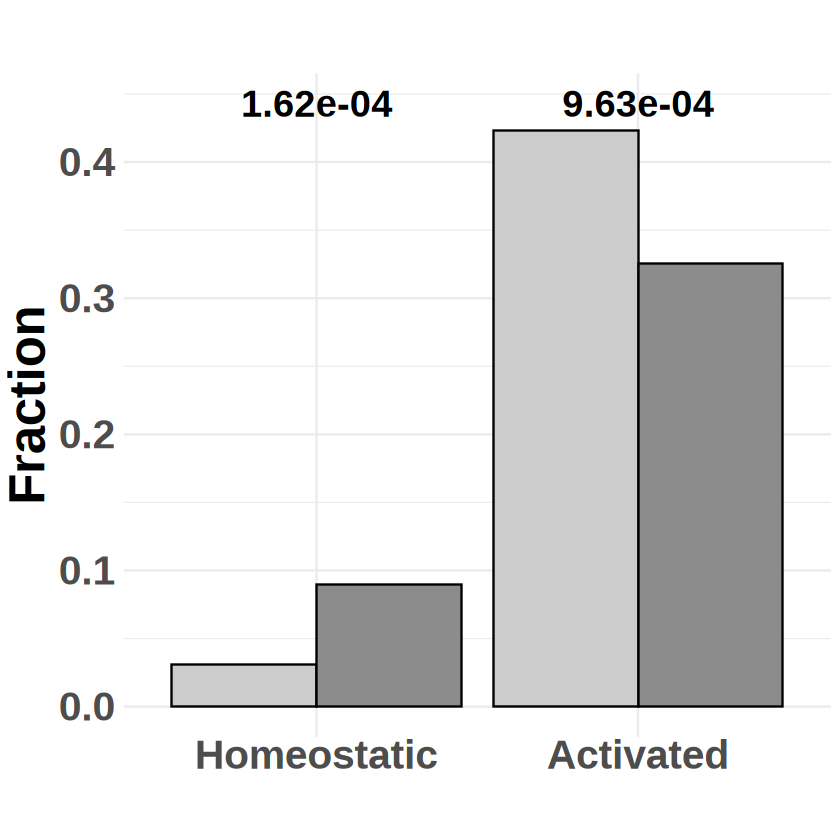

In [18]:
# read the data
exl_file <- read_excel("/home/a.garg/integration_project/step_14/11march_final/BJ_plot_data.xlsx", sheet = "Sheet2", .name_repair = "minimal")

data <- exl_file[, c(1:3, 6)]
data$Cell_state <- factor(data$Cell_state, levels = c("Homeostatic", "Activated"))
data$p.sci <- format(data$`Ab-pval`, digits = 3, scientific = TRUE)
data_long <- gather(data, key = "Ab_Type", value = "Ab_Value", `Ab-Level 0`, `Ab-Others`)



p <- ggplot(data_long, aes(x = Cell_state, y = Ab_Value, fill = Ab_Type)) +
    geom_bar(position = "dodge", stat = "identity", colour = "black") +
    ggtitle("") +
    theme_minimal() +
    scale_fill_manual(values = c("#cccccc", "#8c8c8c")) +
    annotate("text",
        x = c(1, 2), y = max(data_long$Ab_Value) + 0.02,
        label = data$p.sci, size = 8, fontface = "bold"
    ) +
    theme(
        text = element_text(size = 30, face = "bold"),
        axis.text.x = element_text(angle = 0, vjust = 1.5)
    ) + NoLegend()+xlab("")+ylab("Fraction")
ggsave("/home/a.garg/integration_project/step_14/11march_final/Plots/BJ_AB_2-3layer.pdf",width = 6,height = 5,bg ="white")
p

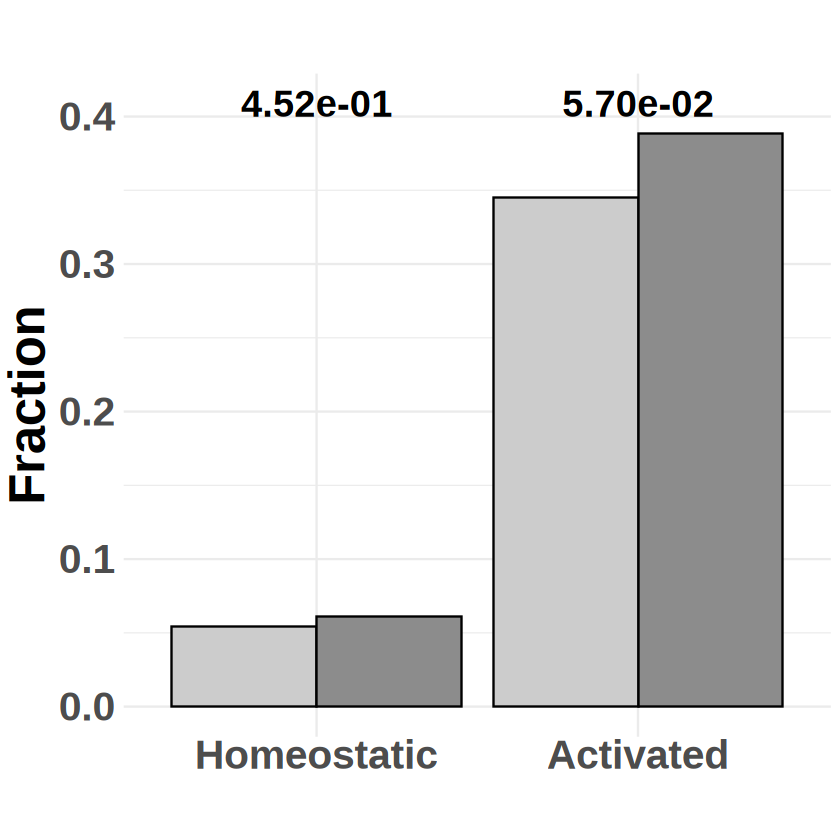

In [19]:
# read the data
exl_file <- read_excel("/home/a.garg/integration_project/step_14/11march_final/BJ_plot_data.xlsx", sheet = "Sheet2", .name_repair = "minimal")

data <- exl_file[, c(1, 4:5, 7)]
data$Cell_state <- factor(data$Cell_state, levels = c("Homeostatic", "Activated"))
data_long <- gather(data, key = "AT8_Type", value = "AT8_Value", `AT8-Level 0`, `AT8-Others`)
data$p.sci <- format(data$`AT8-pval`, scientific = TRUE)


p <- ggplot(data_long, aes(x = Cell_state, y = AT8_Value, fill = AT8_Type)) +
    geom_bar(position = "dodge", stat = "identity", colour = "black") +
    ggtitle("") +
    theme_minimal() +
    scale_fill_manual(values = c("#cccccc", "#8c8c8c")) +
    annotate("text",
        x = c(1, 2), y = max(data_long$AT8_Value) + 0.02,
        label = data$p.sci, size = 8, fontface = "bold"
    ) +
    theme(
        text = element_text(size = 30, face = "bold"),
        axis.text.x = element_text(angle = 0,  vjust = 1.5)
       ) + NoLegend()+xlab("")+ylab("Fraction")
ggsave("/home/a.garg/integration_project/step_14/11march_final/Plots/BJ_AT8_2-3layer.pdf", width = 6,height = 5,bg ="white")
p

layer 4/5/6

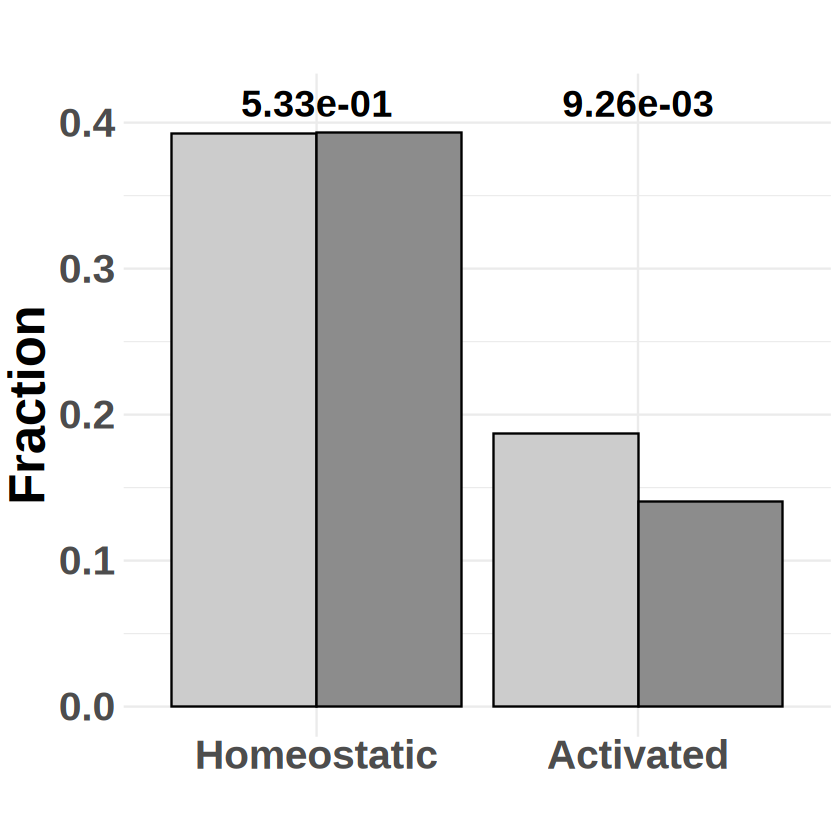

In [20]:
# read the data
exl_file <- read_excel("/home/a.garg/integration_project/step_14/11march_final/BJ_plot_data.xlsx", sheet = "Sheet3", .name_repair = "minimal")

data <- exl_file[, c(1:3, 6)]
data$Cell_state <- factor(data$Cell_state, levels = c("Homeostatic", "Activated"))
data$p.sci <- format(data$`Ab-pval`, digits = 3, scientific = TRUE)
data_long <- gather(data, key = "Ab_Type", value = "Ab_Value", `Ab-Level 0`, `Ab-Others`)



p <- ggplot(data_long, aes(x = Cell_state, y = Ab_Value, fill = Ab_Type)) +
    geom_bar(position = "dodge", stat = "identity", colour = "black") +
    ggtitle("") +
    theme_minimal() +
    scale_fill_manual(values = c("#cccccc", "#8c8c8c")) +
    annotate("text",
        x = c(1, 2), y = max(data_long$Ab_Value) + 0.02,
        label = data$p.sci, size = 8, fontface = "bold"
    ) +
    theme(
        text = element_text(size = 30, face = "bold"),
        axis.text.x = element_text(angle = 0, vjust = 1.5)
   )+ NoLegend()+xlab("")+ylab("Fraction")

ggsave("/home/a.garg/integration_project/step_14/11march_final/Plots/BJ_AB_4-6layer.pdf", width = 6,height = 5,bg ="white")
p

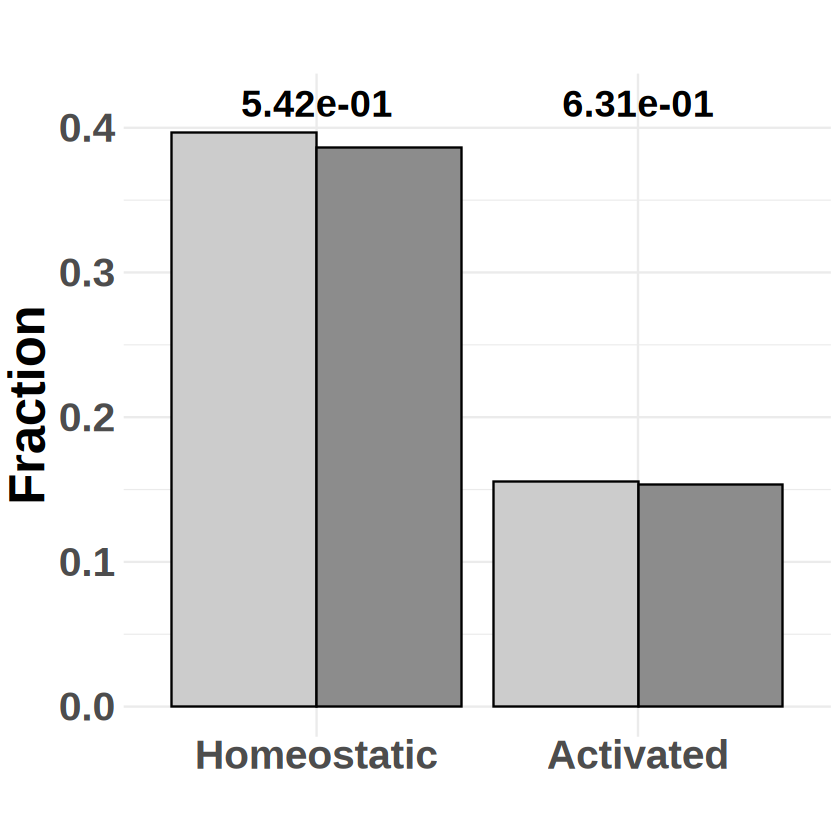

In [21]:
# read the data
exl_file <- read_excel("/home/a.garg/integration_project/step_14/11march_final/BJ_plot_data.xlsx", sheet = "Sheet3", .name_repair = "minimal")

data <- exl_file[, c(1, 4:5, 7)]
data$Cell_state <- factor(data$Cell_state, levels = c("Homeostatic", "Activated"))
data_long <- gather(data, key = "AT8_Type", value = "AT8_Value", `AT8-Level 0`, `AT8-Others`)
data$p.sci <- format(data$`AT8-pval`, scientific = TRUE)


p <- ggplot(data_long, aes(x = Cell_state, y = AT8_Value, fill = AT8_Type)) +
    geom_bar(position = "dodge", stat = "identity", colour = "black") +
    ggtitle("") +
    theme_minimal() +
    scale_fill_manual(values = c("#cccccc", "#8c8c8c")) +
    annotate("text",
        x = c(1, 2), y = max(data_long$AT8_Value) + 0.02,
        label = data$p.sci, size = 8, fontface = "bold"
    ) +
    theme(
        text = element_text(size = 30, face = "bold"),
        axis.text.x = element_text(angle = 0,  vjust = 1.5)
 ) + NoLegend()+xlab("")+ylab("Fraction")

ggsave("/home/a.garg/integration_project/step_14/11march_final/Plots/BJ_AT8_4-6layer.pdf", width = 6,height = 5,bg ="white")
p

AD samples

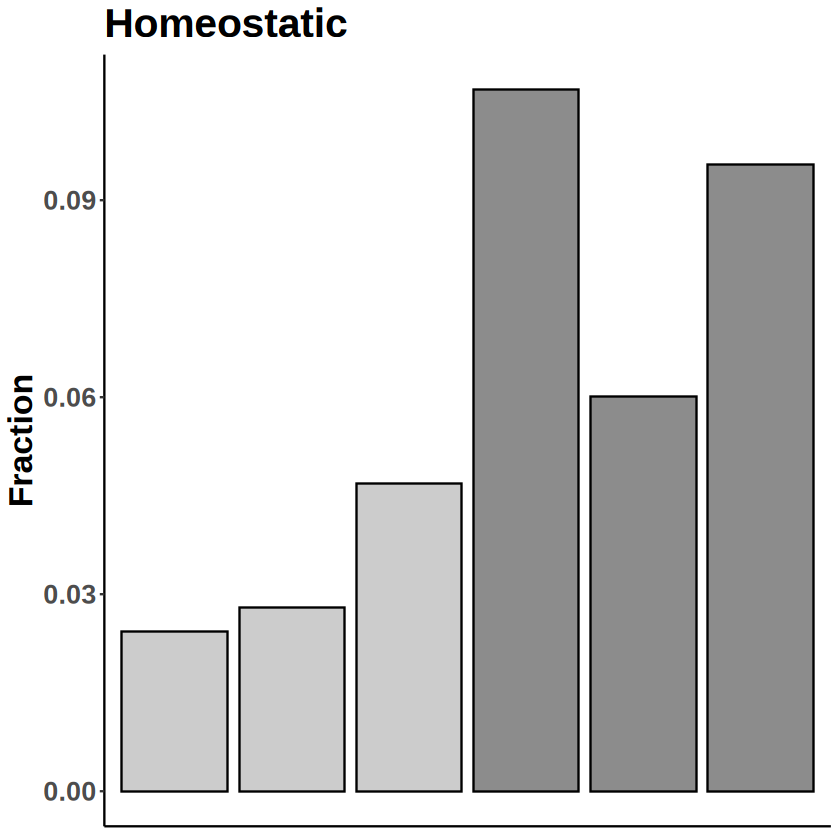

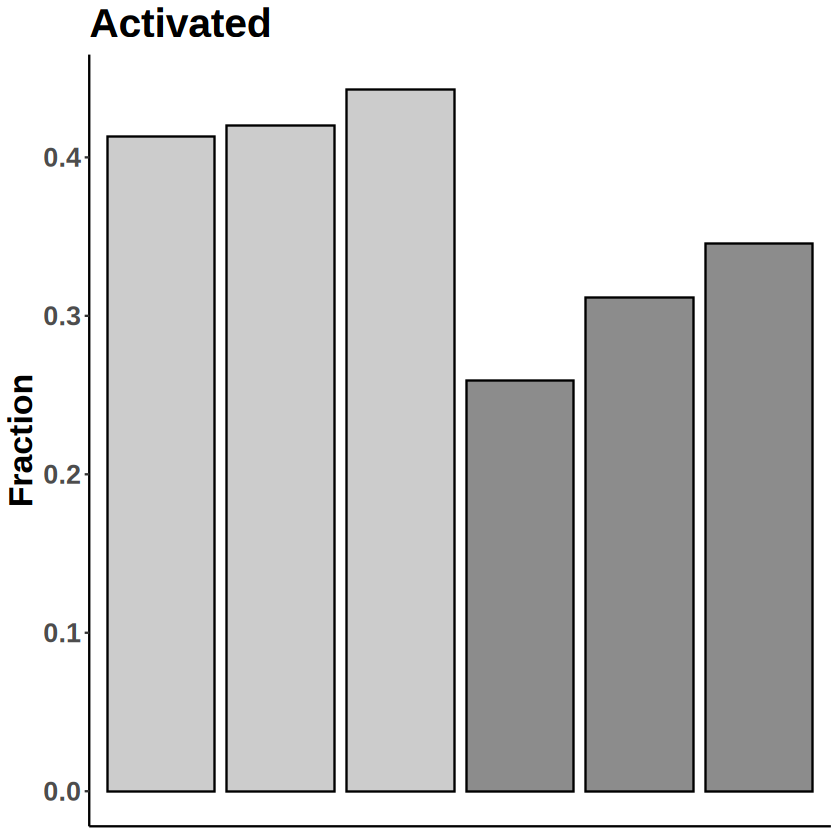

In [2]:
# read the data
exl_file <- read_excel("/home/a.garg/integration_project/step_14/11march_final/BJ_plot_data.xlsx", sheet = "Sheet4", .name_repair = "minimal")
data <- exl_file[, c(1:3, 6)]
data$Cell_state <- factor(data$Cell_state, levels = c("Homeostatic", "Activated"))
sample <- rep(c(rep("AD-1", 2), rep("AD-2", 2), rep("AD-3", 2)))
data$sample <- sample
data_long <- gather(data, key = "Ab_Type", value = "Ab_Value", `Ab-Level 0`, `Ab-Others`)


# Initialize an empty list to store plots
plots <- list()

# Get unique levels of Cell_state
unique_cell_states <- unique(data$Cell_state)

# Iterate through unique levels of Cell_state
plots <- lapply(seq_along(unique_cell_states), function(x) {
  df <- data_long %>% filter(str_detect(Cell_state, levels(data$Cell_state)[x]))
  df_p_val <- data.frame(
    Ab_Type = c("Ab-Others", "Ab-Others", "Ab-Others"),
    group1 = c("AD-1", "AD-2", "AD-3"),
    group2 = c("AD-1", "AD-2", "AD-3"),
    p.val = signif(as.numeric(df$`Ab-pval`)[1:3], digits = 3)
    
  )
df_p_val$p.sci <- format(df_p_val$p.val, scientific = TRUE)


# Create a new variable combining Ab_Type and sample
df$sample_Ab <- factor(paste(df$Ab_Type, df$sample), levels = unique(paste(df$Ab_Type, df$sample)))

# Iterate through unique levels of Cell_state
p <- ggplot(df, aes(x = sample_Ab, y = Ab_Value, fill = Ab_Type)) +
  geom_bar(position = "dodge", stat = "identity", colour = 'black') +
  ggtitle(unique_cell_states[x]) +
 # theme_minimal() +
 theme_classic()+NoLegend()+
  scale_fill_manual(values = c("#cccccc", "#8c8c8c")) +
  theme(text = element_text(size = 20, face = "bold"),
        axis.text.x = element_text(angle = 45, hjust = 1)) +
  #stat_pvalue_manual(df_p_val, label = 'p.sci', y.position = max(df$Ab_Value) + 0.01, size = 6, face = "bold") +
  #NoLegend() +
  xlab("Samples") +
  ylab("Fraction")+
   theme(axis.title.x=element_blank(),
        axis.text.x=element_blank(),
        axis.ticks.x=element_blank())
plot(p)

  plots[[x]] <- p  # Store the plot in the list
})

ggsave(plot = plots[[1]],"/home/a.garg/integration_project/step_14/11march_final/Plots/comp_BJ_AB_2-3layer_samples_hom.pdf", width = 4,height =4,bg ="white")
ggsave(plot = plots[[2]],"/home/a.garg/integration_project/step_14/11march_final/Plots/com_BJ_AB_2-3layer_samples_act.pdf", width = 4,height =4,bg ="white")


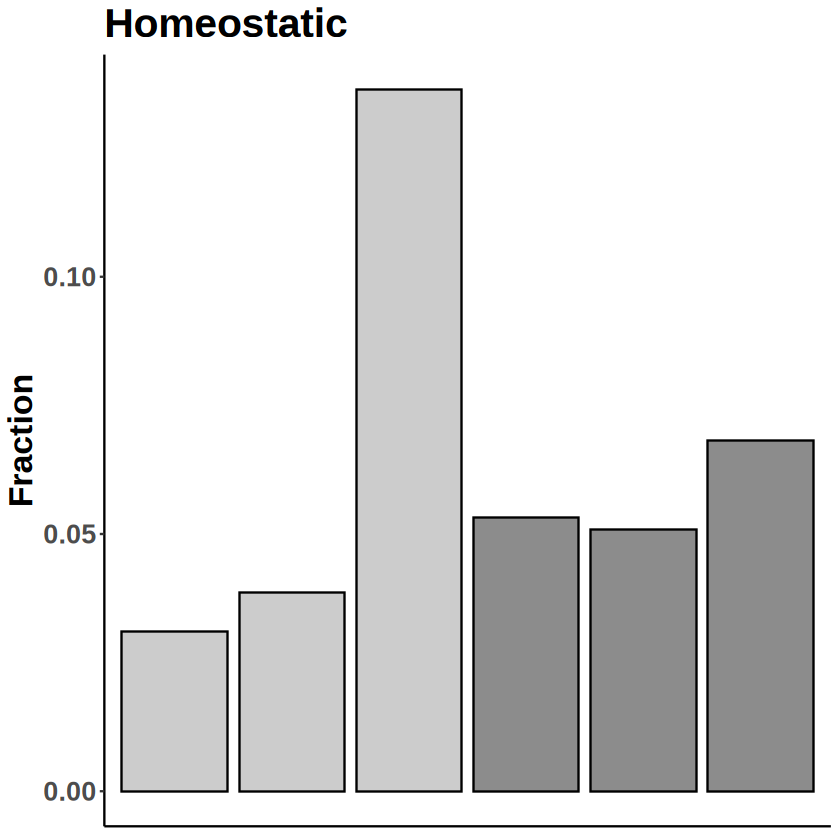

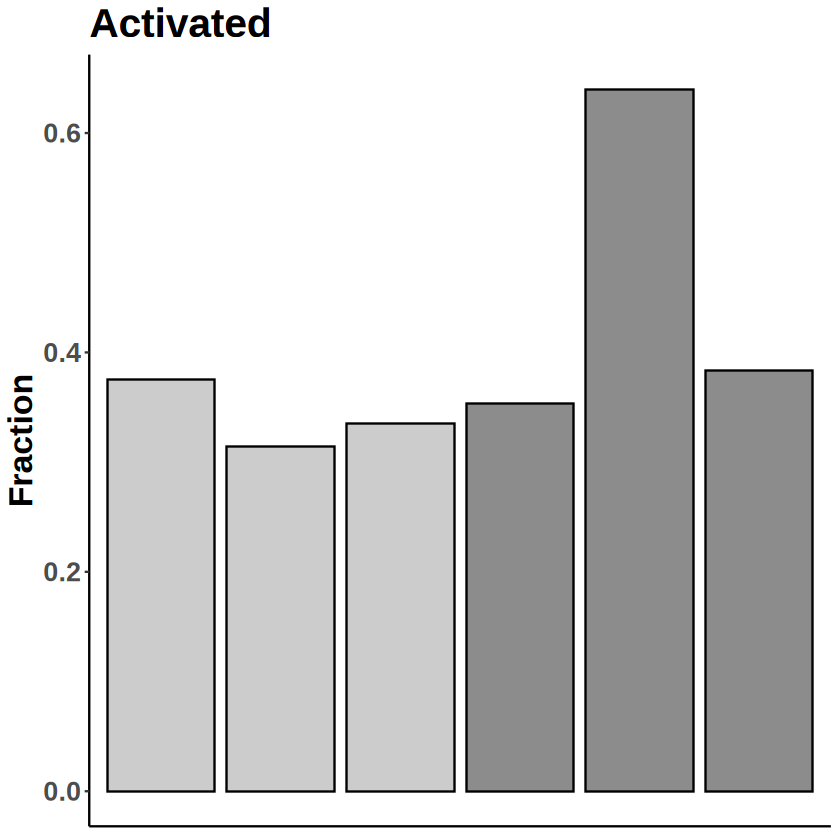

In [2]:
exl_file <- read_excel("/home/a.garg/integration_project/step_14/11march_final/BJ_plot_data.xlsx", sheet = "Sheet4", .name_repair = "minimal")
data <- exl_file[, c(1, 4:5, 7)]
data$Cell_state <- factor(data$Cell_state, levels = c("Homeostatic", "Activated"))
sample <- rep(c(rep("AD-1", 2), rep("AD-2", 2), rep("AD-3", 2)))
data$sample <- sample
data_long <- gather(data, key = "AT8_Type", value = "AT8_Value", `AT8-Level 0`, `AT8-Others`)


# Initialize an empty list to store plots
plots <- list()

# Get unique levels of Cell_state
unique_cell_states <- unique(data$Cell_state)

# Iterate through unique levels of Cell_state
plots <- lapply(seq_along(unique_cell_states), function(x) {
    df <- data_long %>% filter(str_detect(Cell_state, levels(data$Cell_state)[x]))
    df_p_val <- data.frame(
        AT8_Type = c("AT8-Others", "AT8-Others", "AT8-Others"),
        group1 = c("AD-1", "AD-2", "AD-3"),
        group2 = c("AD-1", "AD-2", "AD-3"),
        p.val = signif(df$`AT8-pval`[1:3], digits = 3)
    )
    df_p_val$p.sci <- format(df_p_val$p.val, scientific = TRUE)

# Create a new variable combining AT8_Type and sample
df$sample_AT8 <- factor(paste(df$AT8_Type, df$sample), levels = unique(paste(df$AT8_Type, df$sample)))

# Iterate through unique levels of Cell_state
p <- ggplot(df, aes(x = sample_AT8, y = AT8_Value, fill = AT8_Type)) +
  geom_bar(position = "dodge", stat = "identity", colour = 'black') +
  ggtitle(unique_cell_states[x]) +
 theme_classic()+NoLegend()+
  scale_fill_manual(values = c("#cccccc", "#8c8c8c")) +
  theme(text = element_text(size = 20, face = "bold"),
        axis.text.x = element_text(angle = 45, hjust = 1)) +
  xlab("Samples") +
  ylab("Fraction")+
   theme(axis.title.x=element_blank(),
        axis.text.x=element_blank(),
        axis.ticks.x=element_blank())
plot(p)
plots[[x]] <- p # Store the plot in the list
})


ggsave(plot = plots[[1]],"/home/a.garg/integration_project/step_14/11march_final/Plots/comp_BJ_AT8_2-3layer_samples_hom.pdf", width = 4,height =4,bg ="white")
ggsave(plot = plots[[2]],"/home/a.garg/integration_project/step_14/11march_final/Plots/comp_BJ_AT8_2-3layer_samples_act.pdf", width = 4,height =4,bg ="white")


In [22]:
# read the data
exl_file <- read_excel("/home/a.garg/integration_project/step_14/11march_final/BJ_plot_data.xlsx", sheet = "Sheet4", .name_repair = "minimal")
data <- exl_file[, c(1:3, 6)]
data$Cell_state <- factor(data$Cell_state, levels = c("Homeostatic", "Activated"))
sample <- rep(c(rep("AD-1", 2), rep("AD-2", 2), rep("AD-3", 2)))
data$sample <- sample
data_long <- gather(data, key = "Ab_Type", value = "Ab_Value", `Ab-Level 0`, `Ab-Others`)


# Initialize an empty list to store plots
plots <- list()

# Get unique levels of Cell_state
unique_cell_states <- unique(data$Cell_state)

# Iterate through unique levels of Cell_state
plots <- lapply(seq_along(unique_cell_states), function(x) {
  df <- data_long %>% filter(str_detect(Cell_state, levels(data$Cell_state)[x]))
  df_p_val <- data.frame(
    Ab_Type = c("Ab-Others", "Ab-Others", "Ab-Others"),
    group1 = c("AD-1", "AD-2", "AD-3"),
    group2 = c("AD-1", "AD-2", "AD-3"),
    p.val = signif(as.numeric(df$`Ab-pval`)[1:3], digits = 3)
    
  )
df_p_val$p.sci <- format(df_p_val$p.val, scientific = TRUE)

  p <- ggplot(df, aes(x = sample, y = Ab_Value, fill = Ab_Type)) +
    geom_bar(position = "dodge", stat = "identity", colour = 'black') +
    ggtitle(unique_cell_states[x]) +
    theme_minimal() +
    scale_fill_manual(values = c("#cccccc", "#8c8c8c"))+
    theme(text = element_text(size = 30, face = "bold"),
          axis.text.x = element_text(angle = 45, hjust = 1)) +
    stat_pvalue_manual(df_p_val, label = 'p.sci', y.position = max(df$Ab_Value) + 0.01,size = 6, face ="bold")+
   NoLegend()+xlab("Samples")+ylab("Fraction")
  plots[[x]] <- p  # Store the plot in the list
})

ggsave(plot = plots[[1]],"/home/a.garg/integration_project/step_14/11march_final/Plots/BJ_AB_2-3layer_samples_hom.pdf", width = 6,height =7,bg ="white")

ggsave(plot = plots[[2]],"/home/a.garg/integration_project/step_14/11march_final/Plots/BJ_AB_2-3layer_samples_act.pdf",  width = 6,height =7,bg ="white")


In [23]:
exl_file <- read_excel("/home/a.garg/integration_project/step_14/11march_final/BJ_plot_data.xlsx", sheet = "Sheet4", .name_repair = "minimal")
data <- exl_file[, c(1, 4:5, 7)]
data$Cell_state <- factor(data$Cell_state, levels = c("Homeostatic", "Activated"))
sample <- rep(c(rep("AD-1", 2), rep("AD-2", 2), rep("AD-3", 2)))
data$sample <- sample
data_long <- gather(data, key = "AT8_Type", value = "AT8_Value", `AT8-Level 0`, `AT8-Others`)


# Initialize an empty list to store plots
plots <- list()

# Get unique levels of Cell_state
unique_cell_states <- unique(data$Cell_state)

# Iterate through unique levels of Cell_state
plots <- lapply(seq_along(unique_cell_states), function(x) {
    df <- data_long %>% filter(str_detect(Cell_state, levels(data$Cell_state)[x]))
    df_p_val <- data.frame(
        AT8_Type = c("AT8-Others", "AT8-Others", "AT8-Others"),
        group1 = c("AD-1", "AD-2", "AD-3"),
        group2 = c("AD-1", "AD-2", "AD-3"),
        p.val = signif(df$`AT8-pval`[1:3], digits = 3)
    )
    df_p_val$p.sci <- format(df_p_val$p.val, scientific = TRUE)

    p <- ggplot(df, aes(x = sample, y = AT8_Value, fill = AT8_Type)) +
        geom_bar(position = "dodge", stat = "identity", colour = "black") +
        ggtitle(unique_cell_states[x]) +
        theme_minimal() +
        scale_fill_manual(values = c("#cccccc", "#8c8c8c")) +
        theme(
            text = element_text(size = 30, face = "bold"),
            axis.text.x = element_text(angle = 45, hjust = 1)
        ) +
        stat_pvalue_manual(df_p_val, label = "p.sci", y.position = max(df$AT8_Value) + 0.01,size = 6, face ="bold")+
          NoLegend()+xlab("Samples")+ylab("Fraction")
    plots[[x]] <- p # Store the plot in the list
})


ggsave(plot = plots[[1]],"/home/a.garg/integration_project/step_14/11march_final/Plots/BJ_AT8_2-3layer_samples_hom.pdf",  width = 6,height =7,bg ="white")

ggsave(plot = plots[[2]],"/home/a.garg/integration_project/step_14/11march_final/Plots/BJ_AT8_2-3layer_samples_act.pdf", width = 6,height =7,bg ="white")

Cell_state,Layer 2,Layer 3,Layer 4,Layer 5,Layer 6
<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
Homeostatic,0.03080873,0.0689391,0.2627599,0.4817987,0.4097166
Activated,0.38382542,0.3680582,0.1975425,0.1391863,0.1287449


Scale for fill is already present.
Adding another scale for fill, which will replace the existing scale.


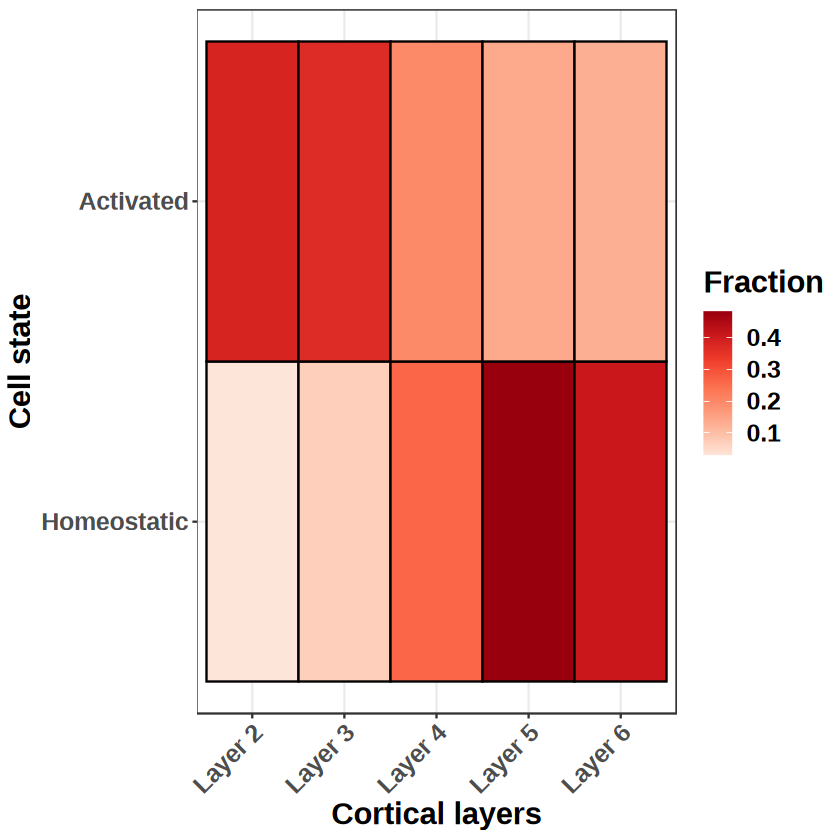

In [24]:
exl_file <- read_excel("/home/a.garg/integration_project/step_14/11march_final/BJ_plot_data.xlsx", sheet = "Sheet5", .name_repair = "minimal")
exl_file

data <- exl_file %>% gather("Layer", "Fraction", -Cell_state)
data$Cell_state <- factor(data$Cell_state, levels = c("Homeostatic", "Activated"))
p <- data %>% ggplot(aes(x = Cell_state , y = Layer, fill = Fraction)) +   geom_tile() +  scale_fill_viridis()+
scale_fill_distiller(palette = "Reds", direction = 1) + 
xlab("Cell state")+ylab("Cortical layers")+ 
#scale_fill_gradient2(low = "white", high = "red") + 
#ggtitle("layers (with top 25%)")+
#coord_fixed()+
coord_flip()+
geom_tile(color = "black", lwd = 0.5)+
theme_bw() + 
#geom_text(aes(label = round(Fraction, digits = 3)))+ 
  theme(text = element_text(size = 18, face = "bold"))
p <- p+theme(axis.text.x = element_text(angle = 45, hjust = 1))
#pdf("heatmap.pdf", height = 6, width = 6)
ggsave("/home/a.garg/integration_project/step_14/11march_final/Plots/BJ_fact_layers_heatmap.pdf", width = 6,height = 2.5)
plot(p)